In [1]:
import os
import re
from IPython.display import clear_output
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
# from oneibl.onelight import ONE # only used for downloading data
# import wget
from utils import *
from plotting_utils import *
from analysis_utils import *
import dglm_hmm1
from pandas.errors import SettingWithCopyWarning
warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)


ibl_data_path = '../data_IBL'
dfAll = pd.read_csv(ibl_data_path + '/Ibl_processed.csv')
colorsFeatures = [['#FAA61A','indigo','#99CC66','#59C3C3','#9593D9'],['#FAA61A',"#2369BD","#A9373B",'#99CC66','#59C3C3','#9593D9']]
#colorsStates = ['orange','firebrick','forestgreen']#['orange','slateblue','forestgreen'] #['#FAA61A','#59C3C3','#9593D9','#99CC66','indigo'] #['darkorange','darkblue','forestgreen','purple']
colorsStates = ['tab:orange','tab:blue', 'tab:green','tab:red']
myFeatures = [['bias','delta stimulus', 'previous choice', 'previous answer'],['bias','contrast left','contrast right', 'previous choice', 'previous answer']]
sns.set_context("talk")
# colormap = ['rebeccapurple','teal','darkturquoise','springgreen','gold']
# colormap = ['rebeccapurple','royalblue','limegreen','orange']
colormap = ['tab:purple','tab:pink','tab:cyan','yellowgreen']

In [2]:
labChosen =  ['angelakilab','churchlandlab','wittenlab']
subjectsAll = []
for lab in labChosen:
    subjects = np.unique(dfAll[dfAll['lab'] == lab]['subject']).tolist()
    subjectsAll = subjectsAll + subjects

if ('NYU-01' in subjectsAll):
    subjectsAll.remove('NYU-01')
if ('NYU-06' in subjectsAll):
    subjectsAll.remove('NYU-06')
if ('CSHL_007' in subjectsAll):
    subjectsAll.remove('CSHL_007')
if ('CSHL049' in subjectsAll):
    subjectsAll.remove('CSHL049')



In [3]:
# setting hyperparameters
sigmaList = [0] + [10**x for x in list(np.arange(-3,1,0.5,dtype=float))] + [10**x for x in list(np.arange(1,4,1,dtype=float))]
alphaList = [2*(10**x) for x in list(np.arange(-1,6,0.5,dtype=float))] 
L2penaltyW = 1
maxiter = 200
bestSigma = 1 # verified from fitting multiple sigmas
bestSigmaInd = 7
bestAlpha = 2
priorDirP = [100,10] # to read dGLMHMM1 model
fit_init_states = False
K = 3
D = 4 # number of features
sessStop = -1 # last session to use in fitting
splitFolds = 5
inits = 21

In [4]:
# NEW SAVING OF FILES AND MORE ANIMALS:
testLlAll = np.zeros((4, len(subjectsAll), len(sigmaList)))
testAccuracyAll = np.zeros((4, len(subjectsAll), len(sigmaList)))
bestTestLl = np.zeros((4, len(subjectsAll)))
bestTestAccuracy = np.zeros((4, len(subjectsAll)))

for idx in range(0, len(subjectsAll)):
    subject = subjectsAll[idx]
    testLl = []
    testAccuracy = []
    avgTestLl = []
    avgTestAccuracy = []
    for K in [1,2,3,4]:
        data = np.load(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_{K}-state_multiple-sigmas_priorDirP={priorDirP}_L2penaltyW={L2penaltyW}_untilSession{sessStop}.npz')
        # fig, axes = plt.subplots(1,figsize=(20,8), dpi=400)
        # fig.suptitle(f'{subject}')
        # for fold in range(0, splitFolds):
        #     plot_testLl_CV_sigma(data['testLl'][fold], sigmaList=sigmaList, label=f'K={K} fold {fold}', color=colormap[K-1], axes=axes)
        avgTestLl.append(np.mean(data['testLl'],axis=0))
        avgTestAccuracy.append(np.mean(data['testAccuracy'],axis=0))
    avgTestLl = [x - avgTestLl[0][0] for x in avgTestLl] # normalizing to GLM-HMM sigma=0 K=1
    avgTestAccuracy = [x - avgTestAccuracy[0][0] for x in avgTestAccuracy]
    
    for K in [1,2,3,4]:
        testLlAll[K-1][idx] = avgTestLl[K-1]
        testAccuracyAll[K-1][idx] = avgTestAccuracy[K-1]

    bestSigmaInd = 7 # Choosing best sigma index across animals
    for K in [1,2,3,4]:
        bestTestLl[K-1][idx] = avgTestLl[K-1][bestSigmaInd] - avgTestLl[0][bestSigmaInd] # delta
        bestTestAccuracy[K-1][idx] = avgTestAccuracy[K-1][bestSigmaInd] - avgTestAccuracy[0][bestSigmaInd] # delta
    
    # # Plotting delta test ll averaged across folds for per-animal plots
    # fig, axes = plt.subplots(1,figsize=(20,8), dpi=400)
    # fig.suptitle(f'{subject}')
    # fig.tight_layout()
    # for K in range(1,5):
    #     plot_testLl_CV_sigma(avgTestLl[K-1], sigmaList=sigmaList, label=f'K={K}', color=colormap[K-1], axes=axes)
    # axes.set_ylabel("Delta Test Ll (per trial)")

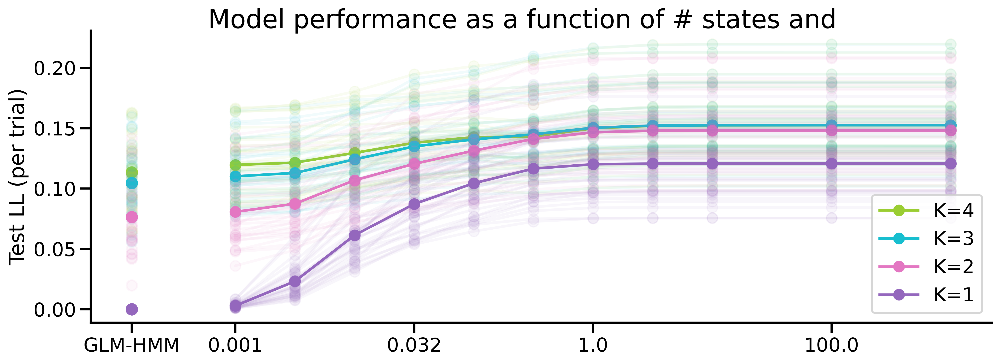

In [5]:
# Plotting one plot with all animals and their mean
fig, axes = plt.subplots(1, figsize = (12,4.5), dpi=400)
fig.tight_layout()
# axes.set_title('averaged across all animals')
for K in range(4,0,-1):
    for idx in range(0, len(subjectsAll)):
        subject = subjectsAll[idx]
        plot_testLl_CV_sigma(testLlAll[K-1][idx], sigmaList=sigmaList, label=None, color=colormap[K-1], axes=axes, alpha=0.06)

    plot_testLl_CV_sigma(np.mean(testLlAll[K-1], axis=0), sigmaList=sigmaList, label=f'K={K}', color=colormap[K-1], axes=axes, alpha=1)
axes.set_ylabel('Test LL (per trial)')
axes.set_xlabel('')
axes.spines[['right', 'top']].set_visible(False)
fig.suptitle('Model performance as a function of # states and ', size=22)
plt.savefig(f'../figures/TestLl_vs_states_sigma_all-animals.png', bbox_inches='tight', dpi=400)

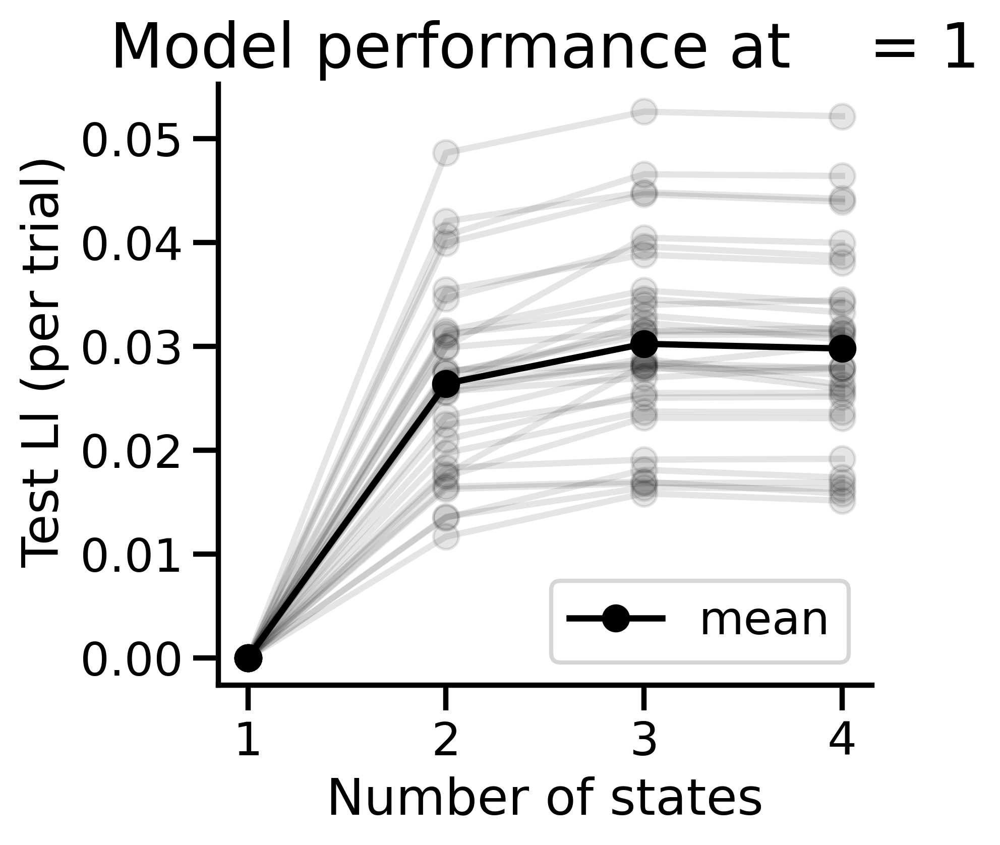

In [6]:
fig, axes = plt.subplots(1,figsize=(4.5,4), dpi=400)
fig.tight_layout()
for idx in range(0, len(subjectsAll)):
    axes.plot([1,2,3,4],bestTestLl[:,idx],'-o', color='black',alpha=0.1)
    axes.set_xticks([1,2,3,4])
# plotting mean across all animals
axes.plot([1,2,3,4], np.mean(bestTestLl, axis=1), '-o', color='black',alpha=1, label='mean')
axes.set_title(f'sigma={np.round(sigmaList[bestSigmaInd],2)}')
axes.set_xlabel('Number of states')
axes.set_ylabel('   Test Ll (per trial)')
axes.spines[['right', 'top']].set_visible(False)
axes.set_title('Model performance at    = 1', size=22)
axes.legend(loc='lower right')
plt.savefig(f'../figures/TestLl_vs_states_sigma=1_all-animals.png', bbox_inches='tight', dpi=400)

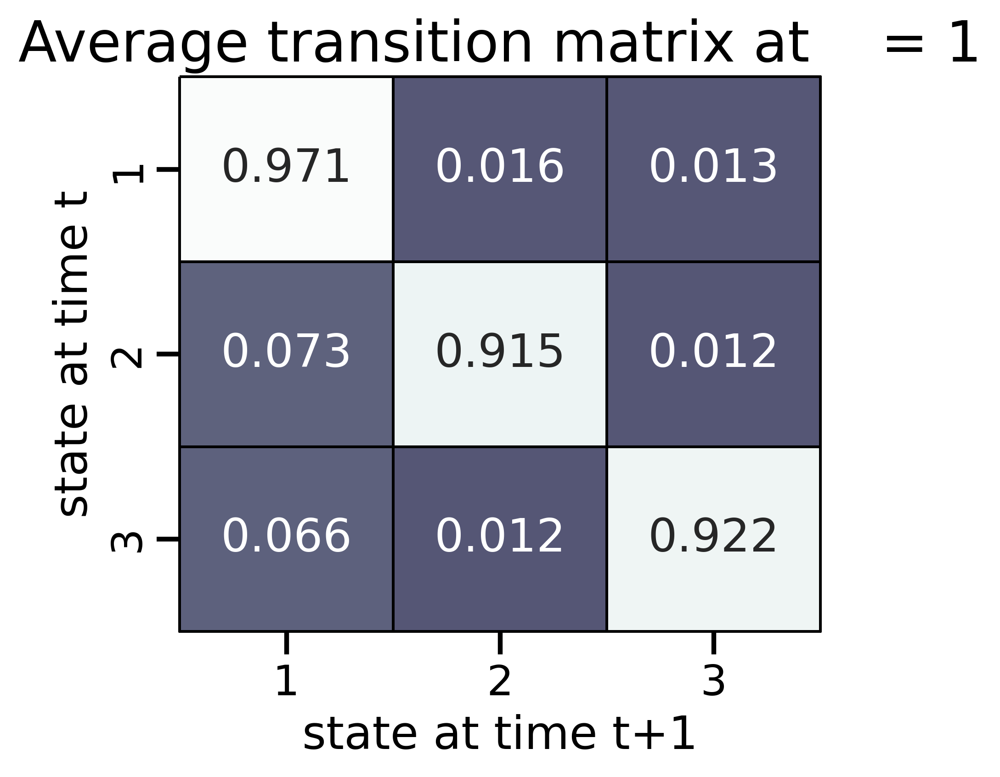

In [7]:
# Reading parameters and plotting them at best sigma for 
bestSigmaInd = 7 # equivalent to sigma=1
K = 3

allP = np.zeros((len(subjectsAll), K, K))   

for idx in range(0, len(subjectsAll)):
    subject=subjectsAll[idx]
    _, _, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    data = np.load(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_{K}-state_multiple-sigmas_priorDirP={priorDirP}_L2penaltyW={L2penaltyW}_untilSession{sessStop}.npz')
    allP[idx] = np.mean(data['allP'], axis=0)[bestSigmaInd]

plt.figure(figsize=(4.5, 4), dpi=400)
K = np.mean(allP, axis=0).shape[0] # 
s = sns.heatmap(np.round(np.mean(allP, axis=0),3),annot=True, vmin=-0.6, vmax=1,cmap='bone', fmt='g', linewidths=1, linecolor='black',clip_on=False, cbar=False)
s.set(xlabel='state at time t+1', ylabel='state at time t', title=f'', xticklabels=range(1,K+1), yticklabels=range(1,K+1))
plt.title('Average transition matrix at    = 1', size=22)
plt.savefig(f'../figures/AverageP_2-state_sigma=1_allAnimals.png', bbox_inches='tight', dpi=400)
      

In [8]:
allW0 = np.empty((len(subjectsAll)), dtype=object)
for idx in range(0, len(subjectsAll)):
    subject=subjectsAll[idx]
    _, _, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

    data = np.load(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_{K}-state_multiple-sigmas_priorDirP={priorDirP}_L2penaltyW={L2penaltyW}_untilSession{sessStop}.npz')
    allW0[idx] = np.mean(data['allW'], axis=0)[0] # standard GLM-HMM

In [9]:
# INIT 0 means initialized from global fit
allW = np.empty((len(subjectsAll)), dtype=object)
allP = np.empty((len(subjectsAll)), dtype=object)

for idx in range(0,len(subjectsAll)):
    subject=subjectsAll[idx]
    _, _, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    param = np.load(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_{K}_state_alpha={bestAlpha}_multiple-initsP_L2penaltyW={L2penaltyW}_untilSession{sessStop}.npz')
    allP[idx] =  param['allP'][0] # starting from best dGLMHMM1 fit
    allW[idx] =  param['allW'][0] # starting from best dGLMHMM1 fit
    

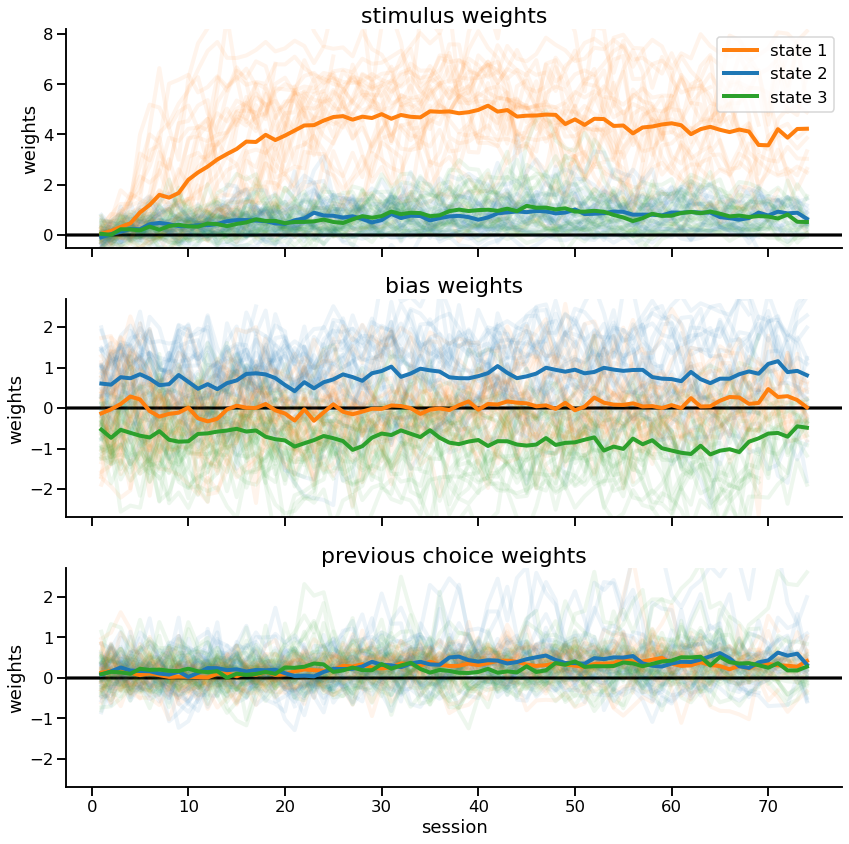

In [10]:
# Plotting weights and transition matrix averaged across all animals - first 70 sessions
maxSess = 75
Kplot = [3]
bestSigmaInd = 7
reorderFeatures = [1,0,2,3] 
myFeatures = ['stimulus','bias','previous choice','previous correct side']
for K in Kplot:
    arrW = np.ma.empty((maxSess, K, D, 2, len(subjectsAll)))
    arrW.mask = True

    #fig, axes = plt.subplots(D, 1,figsize=(12.5,15), sharex=True)#, dpi=400)
    fig, axes = plt.subplots(D-1, 1,figsize=(12.5,12), sharex=True)
    fig.tight_layout(pad=2)
    yLim=[[-0.5,8.2],[-2.7,2.7],[-2.7,2.7],[-2.7,2.7]]

    avgP = []
    avgW = []
    for idx in range(0,len(subjectsAll)):
        subject = subjectsAll[idx] 
        _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

        avgW.append(allW[idx][sessInd[:-1]]) 
        avgP.append(allP[idx][sessInd[:-1]])
        stop = min(avgW[idx].shape[0], maxSess)
        arrW[:stop, :K, :D, :2, idx] = avgW[idx][:stop]
        plotting_weights_per_feature(-(avgW[idx][:stop,:,reorderFeatures[:-1]]), [x for x in range (0, stop)], axes, yLim=yLim, colors=colorsStates, labels=['stimulus','bias','previous choice','previous correct answer'], linewidth=4, linestyle='-', alpha=0.08, legend=False, sortedStateInd=None)
    # plotting_weights_per_feature(-(allW0[0][:,:,reorderFeatures]), [x for x in range (0, maxSess)], axes, yLim=yLim, colors=colorsStates, labels=['stimulus','bias','previous choice','previous correct answer'], linewidth=3, linestyle='--', alpha=1, legend=False, sortedStateInd=None)
    plotting_weights_per_feature(-(arrW.mean(axis=4)[:,:,reorderFeatures[:-1]]), [x for x in range (0, maxSess)], axes, yLim=yLim, colors=colorsStates, labels=['stimulus','bias','previous choice','previous correct answer'], linewidth=4, linestyle='-', alpha=1, legend=True, sortedStateInd=None)
    

for d in range(0,D-1):
    if (d!=0):
        axes[d].get_legend().remove()
        axes[0].legend(loc = 'upper right')
    axes[d].set_ylim(yLim[d])
    axes[d].set_ylabel(f'weights')
    axes[d].set_title(f'{myFeatures[d]} weights', size=22)
    axes[d].spines[['right', 'top']].set_visible(False)

plt.savefig(f'../figures/weights_sigma=1_allAnimals.png', bbox_inches='tight', dpi=400)

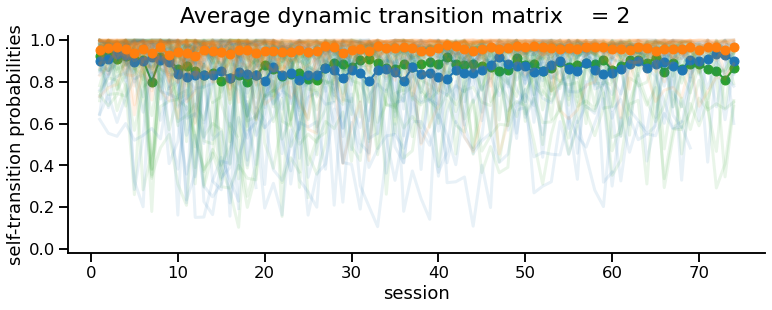

In [11]:
# Plotting weights and transition matrix averaged across all animals - first 70 sessions
maxSess = 75
Kplot = [3]
bestSigmaInd = 7
reorderFeatures = [1,0,2,3] 
#fig, axes = plt.subplots(1, figsize = (12.5,5))
fig, axes = plt.subplots(1, figsize = (12.5,4))
for K in Kplot:
    arrP = np.ma.empty((maxSess, K, K, len(subjectsAll)))
    arrP.mask = True

    avgP = []
    for idx in range(0,len(subjectsAll)):
        subject = subjectsAll[idx] 
        _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

        avgP.append(allP[idx][sessInd[:-1]])
        stop = min(avgW[idx].shape[0], maxSess)
        arrP[:stop, :K, :K, idx] = avgP[idx][:stop]
        sessInd = range(0,stop)
        sess = len(sessInd)-1
        for i in range(0,avgP[idx][:stop].shape[1]):
            axes.plot(range(1,sess+1), avgP[idx][:stop][sessInd[:-1],i,i], linestyle='-', linewidth=3, color=colorsStates[i], label=f'state {i+1}', zorder=avgP[idx][:stop].shape[1]-i, alpha=0.1)
        
        # plotting_self_transition_probabilities(avgP[idx][:stop], range(0,stop), axes, title='', linestyle='-', linewidth=2, save_fig=False, sortedStateInd=None, colorsStates=colorsStates)
    
    plotting_self_transition_probabilities(arrP.mean(axis=3), range(0,maxSess), axes, title='', linewidth=2, save_fig=False, sortedStateInd=None, colorsStates=colorsStates)
    # # plotting transition matrix averaged across folds
    # fig, axes = plt.subplots()
    # plot_transition_matrix(np.mean(avgP, axis=0), title='Averaged', sortedStateInd=None) # not sorted

axes.set_ylabel("self-transition probabilities")
axes.set_xlabel('session')
axes.spines[['right', 'top']].set_visible(False)
fig.suptitle('Average dynamic transition matrix    = 2', size=22)
axes.set_ylim(-0.02,1.02)
plt.savefig(f'../figures/Self-transition_probabilties-alpha={bestAlpha}_allAnimals.png', bbox_inches='tight', dpi=400)
          

In [12]:
# Computing posterior latents across animals
allGamma = np.empty((len(subjectsAll)), dtype=object)
K = 3
truepi = np.ones((K))
for idx in range(0,len(subjectsAll)):
    subject=subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    N = sessInd[-1]
    presentAll = np.ones((N))
    dGLM_HMM = dglm_hmm2.dGLM_HMM2(N,K,D,2)
    allGamma[idx] = dGLM_HMM.get_posterior_latent(allP[idx], truepi, allW[idx], x, y, presentAll, sessInd, sortedStateInd=None)


/Volumes/Lenca_SSD/github/Pillow_dGLM-HMM/code/plotting_utils.py:355: RuntimeWarning: Mean of empty slice
  axes.plot(range(1,len(sessInd)), np.nanmean(np.array([blocksStateRight,blocksStateLeft]),axis=0), color='black',label='mean')
/Volumes/Lenca_SSD/github/Pillow_dGLM-HMM/code/plotting_utils.py:355: RuntimeWarning: Mean of empty slice
  axes.plot(range(1,len(sessInd)), np.nanmean(np.array([blocksStateRight,blocksStateLeft]),axis=0), color='black',label='mean')
/Volumes/Lenca_SSD/github/Pillow_dGLM-HMM/code/plotting_utils.py:355: RuntimeWarning: Mean of empty slice
  axes.plot(range(1,len(sessInd)), np.nanmean(np.array([blocksStateRight,blocksStateLeft]),axis=0), color='black',label='mean')
/Volumes/Lenca_SSD/github/Pillow_dGLM-HMM/code/plotting_utils.py:355: RuntimeWarning: Mean of empty slice
  axes.plot(range(1,len(sessInd)), np.nanmean(np.array([blocksStateRight,blocksStateLeft]),axis=0), color='black',label='mean')
/Volumes/Lenca_SSD/github/Pillow_dGLM-HMM/code/plotting_utils.py

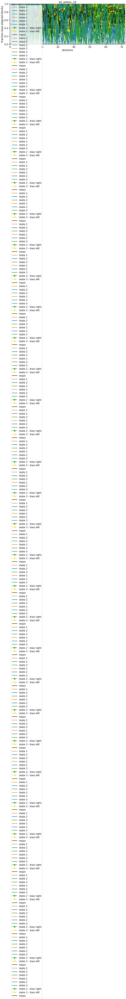

In [13]:
K = 3
allStateCount = np.empty((len(subjectsAll)), dtype=object)
allStateCorrect = np.empty((len(subjectsAll)), dtype=object)
allStateEasyCorrect = np.empty((len(subjectsAll)), dtype=object)
blocksStateRight = np.empty((len(subjectsAll)), dtype=object)
blocksStateLeft = np.empty((len(subjectsAll)), dtype=object)

fig, axes = plt.subplots(1, figsize = (14,5))#, dpi=400)
for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    biasedBlockTrials, biasedBlockStartInd, biasedBlockSession, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)

    # Plotting task occupancy of each state across sessions
    # fig, axes = plt.subplots(1, figsize = (14,5))#, dpi=400)
    axes.set_title(subject)
    allStateCount[idx] = plot_state_occupancy_sessions(allGamma[idx], sessInd, axes, colors=colorsStates)
    axes.set_ylim(-1,101)

    # plotting task accuracy in each state across sessions
    # fig, axes = plt.subplots(1, figsize = (14,5))#, dpi=400)
    axes.set_title(subject)
    allStateCorrect[idx] = plot_task_accuracy_states_sessions(allGamma[idx], y, correctSide, sessInd, axes, firstBlockSession=firstBlockSession, colors=colorsStates)
    axes.set_ylim(40,100)

    # calculating performance on easy trials for each state
    data = dfAll[dfAll['subject']==subject]
    dateToKeep = np.unique(data['date'])    
    dataTemp = pd.DataFrame(data.loc[data['date'].isin(list(dateToKeep))])
    contrastLeft=np.array(dataTemp['contrastLeft'])
    contrastRight=np.array(dataTemp['contrastRight'])
    easyTrials = (contrastLeft > 0.45).astype(int) | (contrastRight > 0.45).astype(int)
    stateHard = np.argmax(allGamma[idx], axis=1)
    allStateEasyCorrect[idx] = np.zeros((len(sessInd)-1, K))
    for session in range(0, len(sessInd)-1):
        for t in range(sessInd[session],sessInd[session+1]):
            if (correctSide[t] == y[t] and easyTrials[t]==1):
                allStateEasyCorrect[idx][session, stateHard[t]] += 1
        for k in range(0,K):
            stateIndices = stateHard[sessInd[session]:sessInd[session+1]] == k
            easyIndices = easyTrials[sessInd[session]:sessInd[session+1]] == 1
            overlapIndices = np.logical_and(stateIndices,easyIndices)
            if (np.where(overlapIndices == True)[0].shape[0] == 0):
                allStateEasyCorrect[idx][session, k] = np.nan
            else:
                allStateEasyCorrect[idx][session, k] = allStateEasyCorrect[idx][session, k] / np.where(overlapIndices == True)[0].shape[0] * 100
    

    # Plotting alignment of biased states with biased blocks
    # fig, axes = plt.subplots(1, figsize=(14,5))
    blocksStateRight[idx], blocksStateLeft[idx] = plot_aligned_fraction_blocks_state(allGamma[idx], sessInd, biasedBlockTrials, biasedBlockSession, axes)

    axes.axvline(firstBlockSession+1, color='gray', zorder=0)

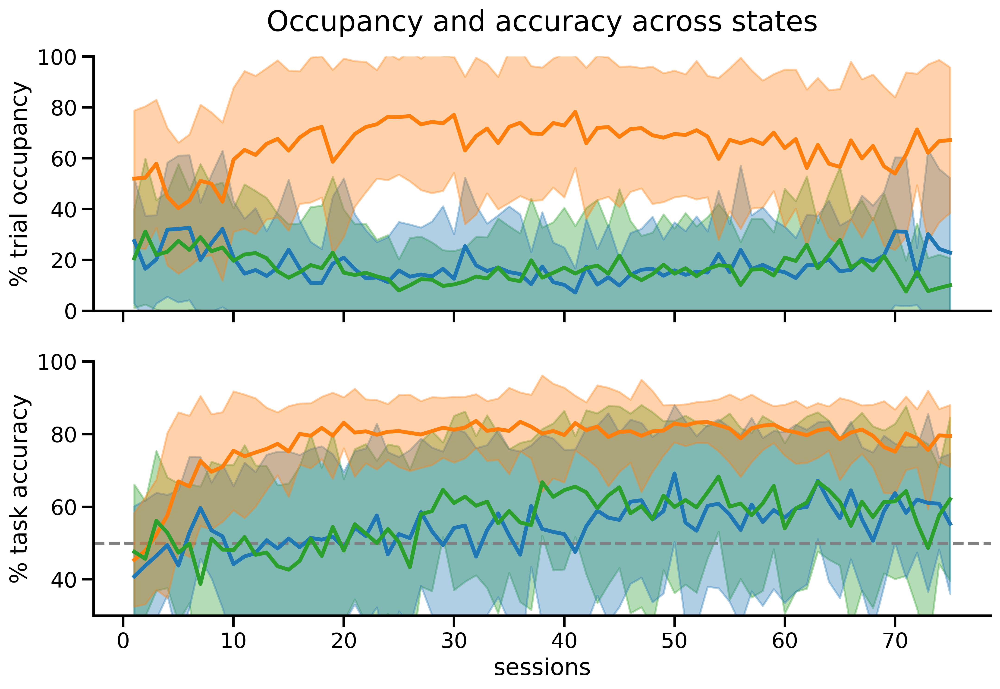

In [14]:
#fig, axes = plt.subplots(2, figsize = (12.5,10), sharex=True, dpi=400) 
fig, axes = plt.subplots(2, figsize = (12.5,8), sharex=True, dpi=400) 
maxSess = 75
bestSigmaInd = 7
K = 3

arrStateCount = np.ma.empty((maxSess,K,len(subjectsAll)))
arrStateCount.mask = True

for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

    stop = min(len(sessInd)-1, maxSess)
    arrStateCount[:stop, :K, idx] = allStateCount[idx][:stop]
    # for k in range(0,K): # not plotting per-animal lines
    #     axes[0].plot(range(1,maxSess+1), arrStateCount[:,k,idx], color=colorsStates[k], linewidth=3, label=f'state {k+1}', alpha=0.08)
   
for k in range(0,K):
    axes[0].plot(range(1,maxSess+1), np.nanmean(arrStateCount[:,k,:], axis=1), color=colorsStates[k], linewidth=3, label=f'state {k+1}', zorder=3)
    axes[0].fill_between(range(1,maxSess+1), np.nanmean(arrStateCount[:,k,:], axis=1)-np.nanstd(arrStateCount[:,k,:], axis=1), np.nanmean(arrStateCount[:,k,:], axis=1)+np.nanstd(arrStateCount[:,k,:], axis=1), alpha=0.35, zorder=2-k, color=colorsStates[k])

axes[0].set_ylabel('% trial occupancy')
axes[0].set_xlabel('')
axes[0].set_ylim(0,100)
axes[0].legend(loc='upper left')

arrStateCorrect = np.ma.empty((maxSess,K,len(subjectsAll)))
arrStateCorrect.mask = True

axes[1].axhline(50,color='gray',linestyle='dashed')
for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

    stop = min(len(sessInd)-1, maxSess)
    arrStateCorrect[:stop, :K, idx] = allStateCorrect[idx][:stop]
    # for k in range(0,K): # not plotting per-animal lines
    #     axes[1].plot(range(1,maxSess+1), arrStateCorrect[:,k,idx], color=colorsStates[k], linewidth=3, label=f'state {k+1}', alpha=0.08)
   
for k in range(0,K):
    axes[1].plot(range(1,maxSess+1), np.nanmean(arrStateCorrect[:,k,:], axis=1), color=colorsStates[k], linewidth=3, label=f'state {k+1}', zorder=3)
    axes[1].fill_between(range(1,maxSess+1), np.nanmean(arrStateCorrect[:,k,:], axis=1)-np.nanstd(arrStateCorrect[:,k,:], axis=1), np.nanmean(arrStateCorrect[:,k,:], axis=1)+np.nanstd(arrStateCorrect[:,k,:], axis=1), alpha=0.35, zorder=2-k, color=colorsStates[k])
axes[1].set_ylabel('% task accuracy')
axes[1].set_xlabel('sessions')
axes[1].set_ylim(30,100)
axes[1].legend(loc='upper left')
axes[0].spines[['right', 'top']].set_visible(False)
axes[1].spines[['right', 'top']].set_visible(False)
axes[0].set_title('Occupancy and accuracy across states', size=22, pad=20)
axes[0].get_legend().remove()
axes[1].get_legend().remove()
plt.savefig(f'../figures/Occupancy_accuracy_states_allAnimals', bbox_inches='tight', dpi=400)


# Figure 6

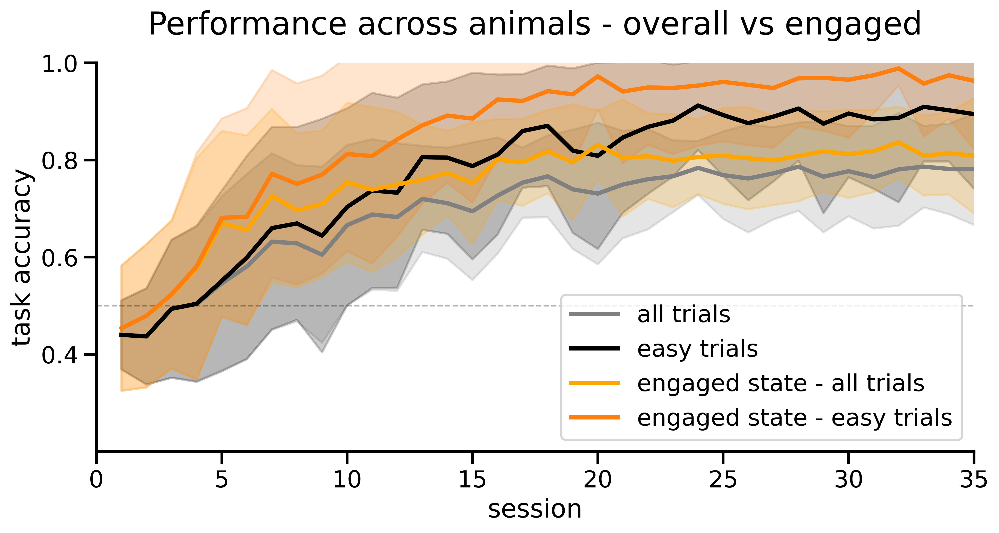

In [15]:
allPerf = np.empty((len(subjectsAll)), dtype=object)
allEasyPerf = np.empty((len(subjectsAll)), dtype=object)

maxSess = 150 #75
arrPerf = np.ma.empty((maxSess,len(subjectsAll)))
arrPerf.mask = True
arrEasyPerf = np.ma.empty((maxSess,len(subjectsAll)))
arrEasyPerf.mask = True

arrEngagedPerf = np.ma.empty((maxSess,len(subjectsAll)))
arrEngagedPerf.mask = True
arrEngagedEasyPerf = np.ma.empty((maxSess,len(subjectsAll)))
arrEngagedEasyPerf.mask = True

for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=-1, D=D)
    biasedBlockTrials, biasedBlockStartInd, biasedBlockSession, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, -1)
    allEasyPerf[idx], allPerf[idx] = IBL_performance(dfAll, subject, plot=False)

    stop = min(len(sessInd)-1, maxSess)
    arrPerf[:stop, idx] = allPerf[idx][:stop]
    arrEasyPerf[:stop, idx] = allEasyPerf[idx][:stop]

    # index 0 for engaged state (state 1)
    arrEngagedPerf[:stop, idx] = allStateCorrect[idx][:stop,0] / 100 # rescaling from 0 to 1 instead of percentages
    arrEngagedEasyPerf[:stop, idx] = allStateEasyCorrect[idx][:stop,0] / 100 

fig, axes = plt.subplots(1, figsize = (11,5), dpi=400) 
# performance in general
axes.fill_between(range(1,maxSess+1), np.nanmean(arrPerf, axis=1)-np.nanstd(arrPerf, axis=1), np.nanmean(arrPerf, axis=1)+np.nanstd(arrPerf, axis=1), alpha=0.2, zorder=0, color="gray")
axes.plot(range(1,maxSess+1), np.nanmean(arrPerf, axis=1), color="gray", linewidth=3, label='all trials', zorder=1)
axes.fill_between(range(1,maxSess+1), np.nanmean(arrEasyPerf, axis=1)-np.nanstd(arrEasyPerf, axis=1), np.nanmean(arrEasyPerf, axis=1)+np.nanstd(arrEasyPerf, axis=1), alpha=0.2, zorder=0, color="black")
axes.plot(range(1,maxSess+1), np.nanmean(arrEasyPerf, axis=1), color="black", linewidth=3, label='easy trials', zorder=1)


# performance in state 1
axes.fill_between(range(1,maxSess+1), np.nanmean(arrEngagedPerf, axis=1)-np.nanstd(arrEngagedPerf, axis=1), np.nanmean(arrEngagedPerf, axis=1)+np.nanstd(arrEngagedPerf, axis=1), alpha=0.2, zorder=0, color="orange")
axes.plot(range(1,maxSess+1), np.nanmean(arrEngagedPerf, axis=1), color="orange", linewidth=3, label='engaged state - all trials', zorder=1)
axes.fill_between(range(1,maxSess+1), np.nanmean(arrEngagedEasyPerf, axis=1)-np.nanstd(arrEngagedEasyPerf, axis=1), np.nanmean(arrEngagedEasyPerf, axis=1)+np.nanstd(arrEngagedEasyPerf, axis=1), alpha=0.2, zorder=0, color='tab:orange')
axes.plot(range(1,maxSess+1), np.nanmean(arrEngagedEasyPerf, axis=1), color="tab:orange", linewidth=3, label='engaged state - easy trials', zorder=1)

axes.set_ylabel('task accuracy')
axes.set_xlabel('session')
axes.set_yticks([0.4,0.6,0.8,1.0])
axes.set_ylim(0.2,1.0)
axes.set_xlim(0,35)
axes.axhline(0.5, color="black", linestyle="--", lw=1, alpha=0.3, zorder=0)
axes.spines[['right', 'top']].set_visible(False)
axes.legend(loc='lower right')
axes.set_title('Performance across animals - overall vs engaged' ,size=22, pad=20)
plt.savefig(f'../figures/Accuracy_TotalvsEngaged_allAnimals', bbox_inches='tight', dpi=400)

[ 6.  7. 14. 24.  9. 23. 59. 12. 11. 16. 29. 19. 18. 46. 10. 10. 11. 14.
 20. 13. 13. 24.  9.  5. 20.  7. 28.  5. 13.  8. 20. 12.]


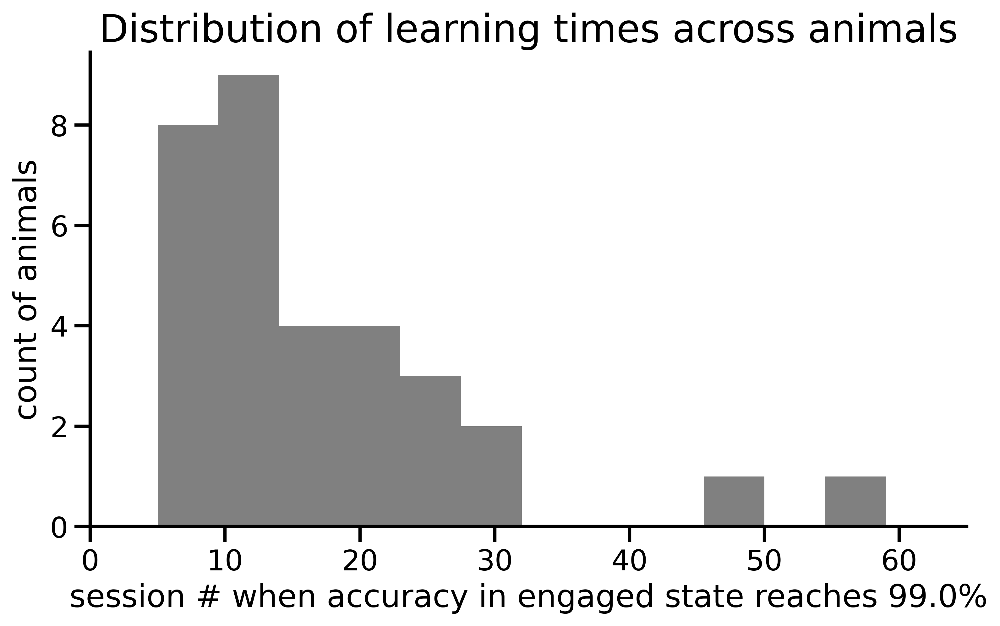

In [16]:
# Learning across animals - Distribution
# Time it takes for accuracy in engaged state to reach threshold 
from astropy.stats import bayesian_blocks
treshold = 0.99
def learning_time(accuracySession, treshold=0.95): # decide between accuracy on all trials and accuracy on easy trials
    sessions = accuracySession.shape[0]
    time = -1
    for t in range(1,sessions):
        if (np.mean(accuracySession[t-1:t+1]) >= treshold):
            time = t
            break 
    return time

learningTimes = np.zeros((len(subjectsAll)))
for idx in range(0, len(subjectsAll)):
    learningTimes[idx] = learning_time(arrEngagedEasyPerf[:,idx], treshold=treshold)
print(learningTimes)
fig, axes = plt.subplots(1, figsize = (9,5), dpi=400) 
axes.hist(learningTimes, bins=12, color='gray')
axes.set_xlim(0,65)
axes.spines[['right', 'top']].set_visible(False)
axes.set_xlabel('session # when accuracy in engaged state reaches ' + str(treshold*100) +'%')
axes.set_ylabel('count of animals')
axes.set_title('Distribution of learning times across animals', size=22)
plt.savefig(f'../figures/LearningTimes_Distribution_allAnimals', bbox_inches='tight', dpi=400)


/var/folders/w4/p225s7cd19n0j6tss7pdl21w0000gn/T/ipykernel_26281/2146645631.py:33: RuntimeWarning: Mean of empty slice
  axes.scatter(np.nanmean(rightBiasPerformance[idx])*100, np.nanmean(leftBiasPerformance[idx])*100, color='black', s=35)


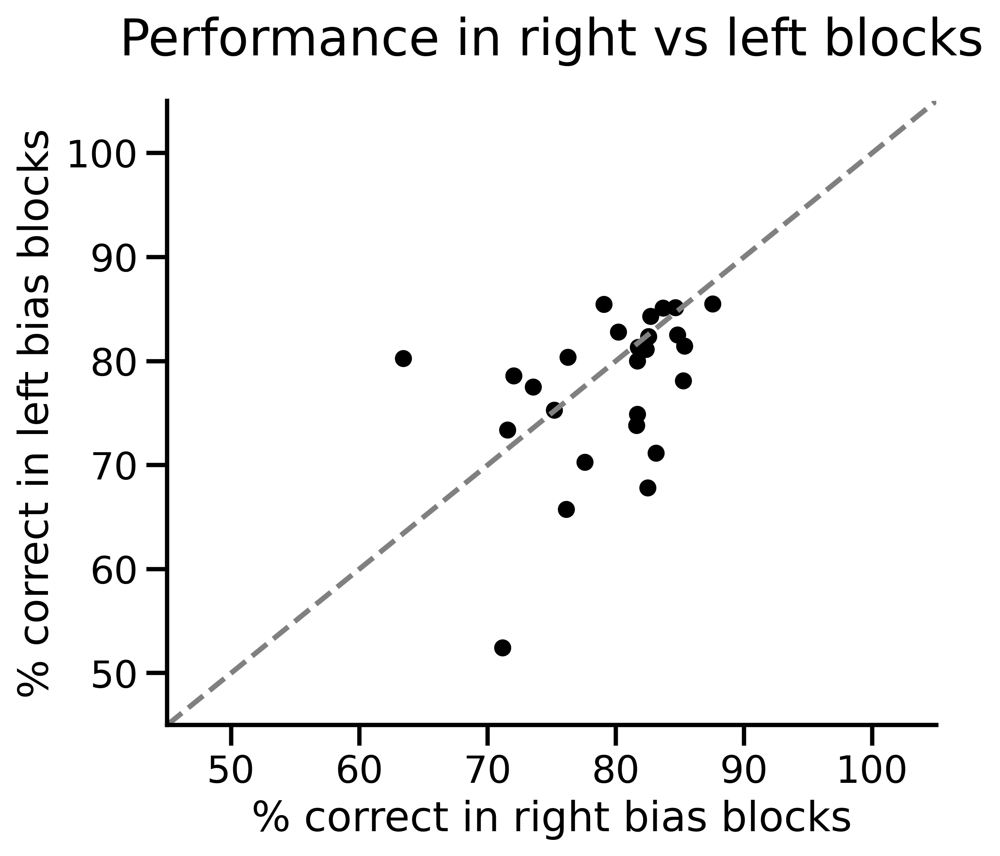

In [17]:
# performance in right vs left blocks
rightBiasPerformance = np.empty((len(subjectsAll)), dtype=object)
leftBiasPerformance = np.empty((len(subjectsAll)), dtype=object)
for idx in range(0, len(subjectsAll)):
    subject = subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D) # NOT LOOKING AT FULL DATASET
    biasedBlockTrials, biasedBlockStartInd, biasedBlockSession, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)
    N = x.shape[0]

    correctChoice = (y == correctSide).astype(int) # 1 if animal made correct choice
    sess = len(sessInd)-1
    rightBiasPerformance[idx] = np.zeros((sess))
    leftBiasPerformance[idx] = np.zeros((sess))
    for s in range(0,sess):
        biasedRight = (biasedBlockTrials[sessInd[s]:sessInd[s+1]]==1)
        if biasedRight.sum() > 0:
            rightBiasPerformance[idx][s] = correctChoice[sessInd[s]+np.argwhere(biasedRight==True)].sum() / biasedRight.sum()
        else: 
            rightBiasPerformance[idx][s] = np.nan
        
        biasedLeft = (biasedBlockTrials[sessInd[s]:sessInd[s+1]]==-1)
        if biasedLeft.sum() > 0:
            leftBiasPerformance[idx][s] = correctChoice[sessInd[s]+np.argwhere(biasedLeft==True)].sum() / biasedLeft.sum()
        else: 
            leftBiasPerformance[idx][s] = np.nan

# plotting right bias performance vs left bias performance across animals avereaged across sessions
fig, axes = fig, axes = plt.subplots(1, figsize = (6,5), dpi=400)
sns.set_context("talk")
axes.set_xlabel('% correct in right bias blocks')
axes.set_ylabel('% correct in left bias blocks')
for idx in range(0,len(subjectsAll)):
    axes.scatter(np.nanmean(rightBiasPerformance[idx])*100, np.nanmean(leftBiasPerformance[idx])*100, color='black', s=35)
    # ADD DIFFERENT COLOR FOR EACH LAB
axes.set_xlim(45,105)
axes.set_ylim(45,105)
axes.plot([0, 1], [0, 1], transform=axes.transAxes, linestyle='dashed', color='gray')
axes.spines[['right', 'top']].set_visible(False)
axes.set_title('Performance in right vs left blocks', size=22, pad=20)
plt.savefig(f'../figures/Correct_Right_Vs_Left_ScatterPlot', bbox_inches='tight', dpi=400)

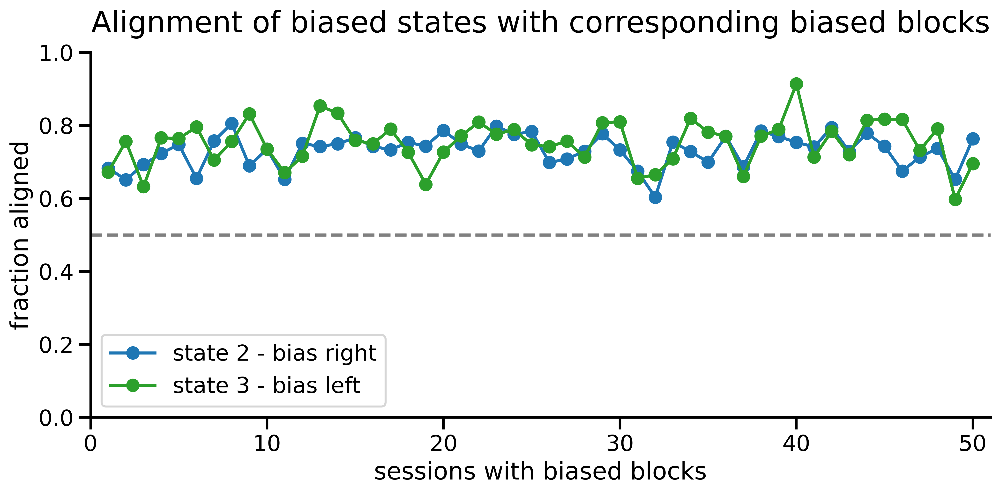

In [18]:
# Average across animals of bias-block alignment with first biased session aligned across animals
maxSess = 50
bestSigmaInd = 7
K = 3

arrAlignRight = np.ma.empty((maxSess,len(subjectsAll)))
arrAlignRight.mask = True

arrAlignLeft = np.ma.empty((maxSess,len(subjectsAll)))
arrAlignLeft.mask = True

fig, axes = plt.subplots(1, figsize = (12,5), dpi=400)
axes.axhline(0.5,color='gray',linestyle='dashed')
axes.set_title('Alignment of biased states with corresponding biased blocks', size=22, pad=15)
for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    _, _, _, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)
    if (np.isnan(firstBlockSession) == False):
        stop = min(len(sessInd)-1, firstBlockSession+maxSess)
        arrAlignRight[:stop-firstBlockSession, idx] = blocksStateRight[idx][firstBlockSession:stop]
        arrAlignLeft[:stop-firstBlockSession, idx] = blocksStateLeft[idx][firstBlockSession:stop]
        
axes.plot(range(1,maxSess+1), np.nanmean(arrAlignRight[:,:], axis=1), '-o', color=colorsStates[1], label='state 2 - bias right', alpha=1)
axes.plot(range(1,maxSess+1), np.nanmean(arrAlignLeft[:,:], axis=1), '-o', color=colorsStates[2], label='state 3 - bias left', alpha=1)
# axes.plot(range(1,maxSess+1), (np.nanmean(arrAlignRight[:,:], axis=1)+np.nanmean(arrAlignLeft[:,:], axis=1))/2, '-o', color='black',label='mean')
axes.legend()
axes.set_xlim(0,maxSess+1)
axes.axhline(0.5,color='gray',linestyle='dashed')
axes.set_ylim(0,1)
axes.set_xlabel('sessions with biased blocks')
axes.set_ylabel('fraction aligned')
axes.spines[['right', 'top']].set_visible(False)
plt.savefig(f'../figures/Fraction_Aligned_States-and-Blocks_allAnimals', bbox_inches='tight', dpi=400)


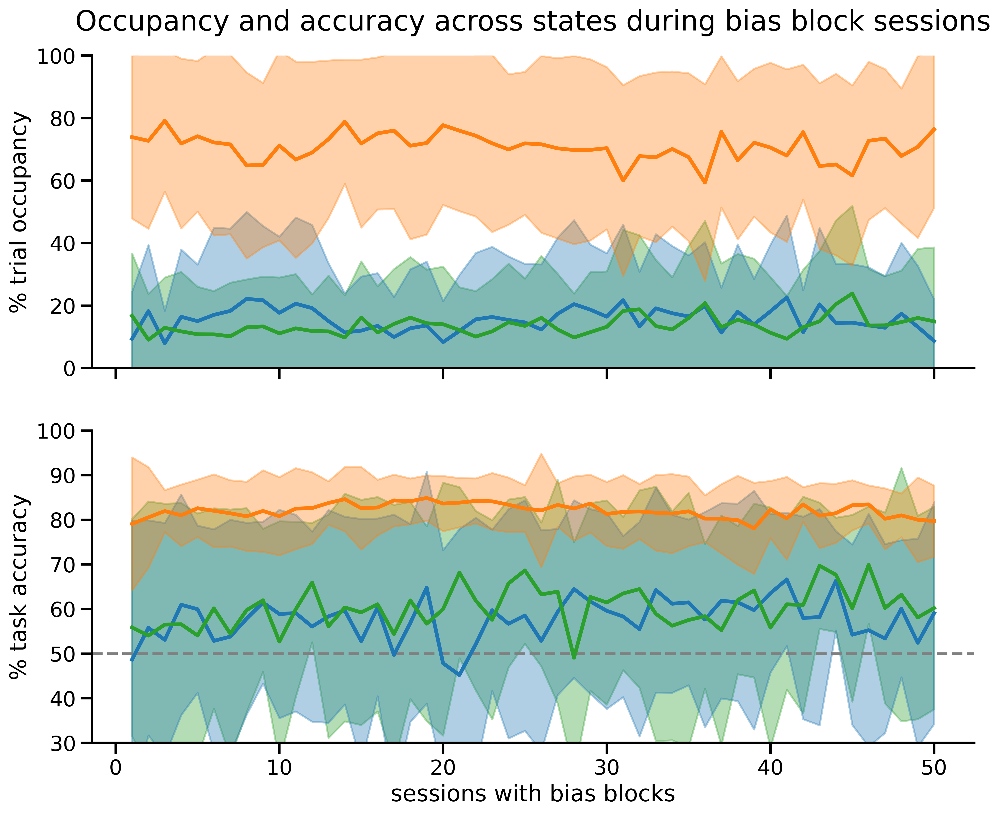

In [19]:
# ALIGNED TO BIASED BLOCKS
fig, axes = plt.subplots(2, figsize = (12.5,10), sharex=True, dpi=400) 
maxSess = 50
bestSigmaInd = 7
K = 3

arrStateCount = np.ma.empty((maxSess,K,len(subjectsAll)))
arrStateCount.mask = True

for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    _, _, _, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)

    if (np.isnan(firstBlockSession) == False):
        stop = min(len(sessInd)-1, firstBlockSession+maxSess)
        arrStateCount[:stop-firstBlockSession, :K, idx] = allStateCount[idx][firstBlockSession:stop]
    # for k in range(0,K): # not plotting per-animal lines
    #     axes[0].plot(range(1,maxSess+1), arrStateCount[:,k,idx], color=colorsStates[k], linewidth=3, label=f'state {k+1}', alpha=0.08)
   
for k in range(0,K):
    axes[0].plot(range(1,maxSess+1), np.nanmean(arrStateCount[:,k,:], axis=1), color=colorsStates[k], linewidth=3, label=f'state {k+1}', zorder=3)
    axes[0].fill_between(range(1,maxSess+1), np.nanmean(arrStateCount[:,k,:], axis=1)-np.nanstd(arrStateCount[:,k,:], axis=1), np.nanmean(arrStateCount[:,k,:], axis=1)+np.nanstd(arrStateCount[:,k,:], axis=1), alpha=0.35, zorder=2-k, color=colorsStates[k])

axes[0].set_ylabel('% trial occupancy')
axes[0].set_xlabel('')
axes[0].set_ylim(0,100)
axes[0].legend(loc='upper left')

arrStateCorrect = np.ma.empty((maxSess,K,len(subjectsAll)))
arrStateCorrect.mask = True

axes[1].axhline(50,color='gray',linestyle='dashed')
for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    _, _, _, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)

    if (np.isnan(firstBlockSession) == False):
        stop = min(len(sessInd)-1, firstBlockSession+maxSess)
        arrStateCorrect[:stop-firstBlockSession, :K, idx] = allStateCorrect[idx][firstBlockSession:stop]
    # for k in range(0,K): # not plotting per-animal lines
    #     axes[1].plot(range(1,maxSess+1), arrStateCorrect[:,k,idx], color=colorsStates[k], linewidth=3, label=f'state {k+1}', alpha=0.08)
   
for k in range(0,K):
    axes[1].plot(range(1,maxSess+1), np.nanmean(arrStateCorrect[:,k,:], axis=1), color=colorsStates[k], linewidth=3, label=f'state {k+1}', zorder=3)
    axes[1].fill_between(range(1,maxSess+1), np.nanmean(arrStateCorrect[:,k,:], axis=1)-np.nanstd(arrStateCorrect[:,k,:], axis=1), np.nanmean(arrStateCorrect[:,k,:], axis=1)+np.nanstd(arrStateCorrect[:,k,:], axis=1), alpha=0.35, zorder=2-k, color=colorsStates[k])
axes[1].set_ylabel('% task accuracy')
axes[1].set_xlabel('sessions with bias blocks')
axes[1].set_ylim(30,100)
axes[1].legend(loc='upper left')
axes[0].spines[['right', 'top']].set_visible(False)
axes[1].spines[['right', 'top']].set_visible(False)
axes[0].set_title('Occupancy and accuracy across states during bias block sessions', size=22, pad=20)
axes[0].get_legend().remove()
axes[1].get_legend().remove()
plt.savefig(f'../figures/Occupancy_accuracy_states_allAnimals-biasblocks', bbox_inches='tight', dpi=400)


In [33]:
# MIXTURE MODEL TO TEST ALIGNMENT

allMixtureCorrect = np.empty((len(subjectsAll)), dtype=object)

for idx in range(0,len(subjectsAll)):
    print('Animal ',idx)
    subject = subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=-1, D=D)
    dGLM_HMM = dglm_hmm2.dGLM_HMM2(x.shape[0],K,D,2)
    phi = dGLM_HMM.observation_probability(x,allW[idx])
    totalMixtures = 100
    mixtureY = np.zeros((totalMixtures, x.shape[0]))
    mixtureStateHard = np.zeros((totalMixtures, x.shape[0]))
    for mixture in range(0,totalMixtures):
        for sess in range(0,len(sessInd)-1):
            currentStateProb = np.mean(allGamma[idx][sessInd[sess]:sessInd[sess+1]], axis=0)
            for t in range(sessInd[sess],sessInd[sess+1]):
                mixtureStateHard[mixture,t] = np.random.choice(range(0, K), p=currentStateProb).astype(int) # mixture model, no temporal dependency
                mixtureY[mixture,t] = np.random.binomial(n=1, p=phi[t,int(mixtureStateHard[mixture,t]),1])

    MixtureCorrect = np.zeros((totalMixtures, len(sessInd)-1, K))
    # fig, axes = plt.subplots(1, figsize=(13,5),dpi=400)
    for mixture in range(0,totalMixtures):
        for session in range(0, len(sessInd)-1):
            for t in range(sessInd[session],sessInd[session+1]):
                if (correctSide[t] == mixtureY[mixture,t]):
                    MixtureCorrect[mixture, session, int(mixtureStateHard[mixture,t])] += 1
            for k in range(0,K):
                if (np.where(mixtureStateHard[mixture, sessInd[session]:sessInd[session+1]] == k)[0].shape[0] == 0):
                    MixtureCorrect[mixture, session, k] = np.nan
                else:
                    MixtureCorrect[mixture, session, k] = MixtureCorrect[mixture,session, k] / np.where(mixtureStateHard[mixture,sessInd[session]:sessInd[session+1]] == k)[0].shape[0] * 100
    allMixtureCorrect[idx] =  np.mean(MixtureCorrect,axis=0)
    # for k in range(0,K):
    #     axes.plot(range(1,len(sessInd)), np.mean(allMixtureCorrect[idx],axis=0)[:,k], color=colorsStates[k], linewidth=3, linestyle='--')
    #     axes.plot(range(1,len(sessInd)), allStateCorrect[idx][:,k], color=colorsStates[k], linewidth=3, linestyle='-')
    # axes.set_ylim(0,100)
    # axes.set_ylabel('% task accuracy ')
    # axes.set_xlabel('session')
    # axes.legend(loc='lower right')
    # if (firstBlockSession is not None):
    #     axes.axvline(firstBlockSession+1, color='gray', zorder=0)


Animal  0
Animal  1
Animal  2
Animal  3
Animal  4
Animal  5
Animal  6
Animal  7
Animal  8
Animal  9
Animal  10
Animal  11
Animal  12
Animal  13
Animal  14
Animal  15
Animal  16
Animal  17
Animal  18
Animal  19
Animal  20
Animal  21
Animal  22
Animal  23
Animal  24
Animal  25
Animal  26
Animal  27
Animal  28
Animal  29
Animal  30
Animal  31


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


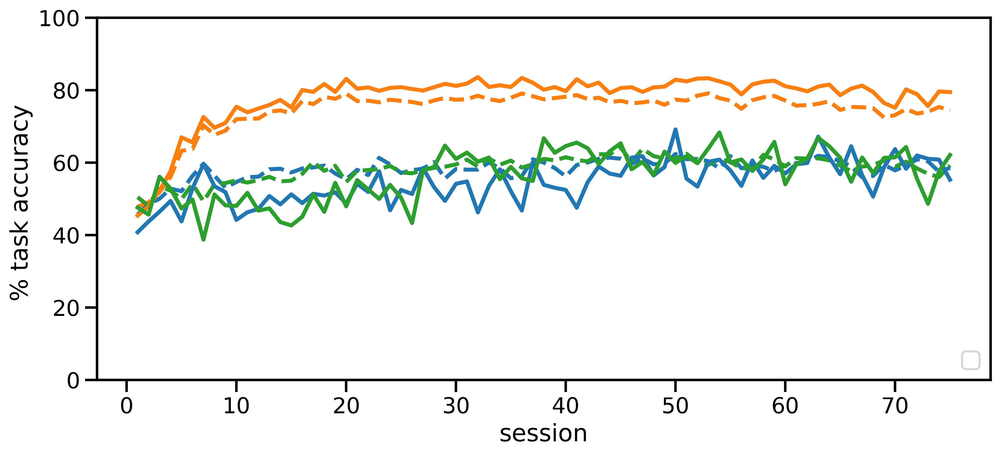

In [34]:
maxSess = 75
arrMixtureCorrect = np.ma.empty((maxSess,K,len(subjectsAll)))
arrMixtureCorrect.mask = True

for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    
    stop = min(len(sessInd)-1, maxSess)
    arrMixtureCorrect[:stop, :K, idx] = allMixtureCorrect[idx][:stop]

fig, axes = plt.subplots(1, figsize = (12,5), sharex=True, dpi=400) 
for k in range(0,K):
    axes.plot(range(1,maxSess+1), np.nanmean(arrMixtureCorrect[:,k],axis=1), color=colorsStates[k], linewidth=3, linestyle='--')
axes.set_ylim(0,100)
axes.set_ylabel('% task accuracy ')
axes.set_xlabel('session')
axes.legend(loc='lower right')

arrStateCorrect = np.ma.empty((maxSess,K,len(subjectsAll)))
arrStateCorrect.mask = True

for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

    stop = min(len(sessInd)-1, maxSess)
    arrStateCorrect[:stop, :K, idx] = allStateCorrect[idx][:stop]
for k in range(0,K):
    axes.plot(range(1,maxSess+1), np.nanmean(arrStateCorrect[:,k],axis=1), color=colorsStates[k], linewidth=3, linestyle='-')

   

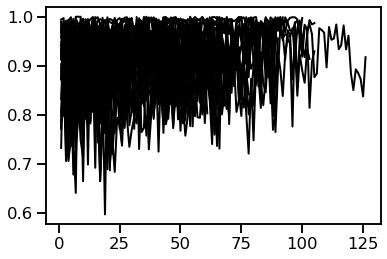

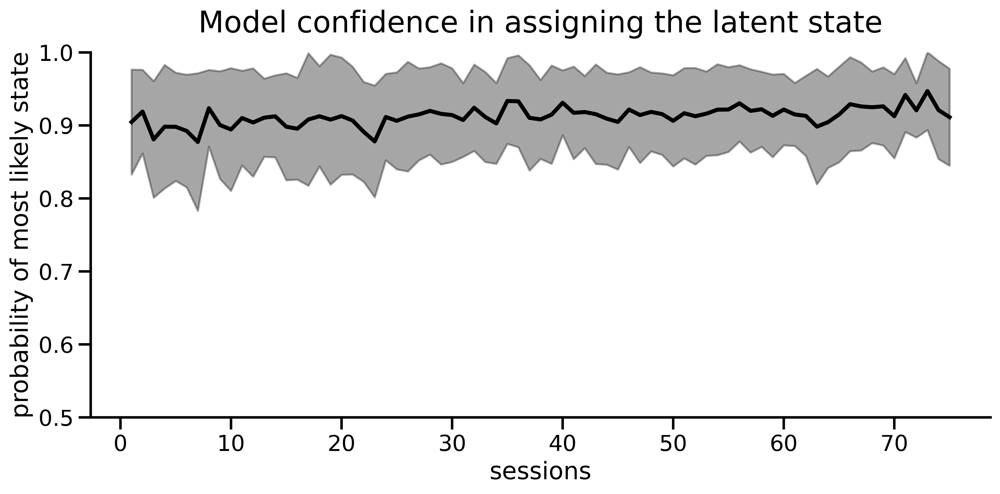

In [82]:
# Probability of most likely state - average across animals
maxSess = 75
bestSigmaInd = 7
K = 3

arrProbStateMax = np.ma.empty((maxSess,len(subjectsAll)))
arrProbStateMax.mask = True

fig, axes = plt.subplots(1) 
for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

    probMaxSession = distribution_most_likely_state(allGamma[idx], sessInd, axes)
    
    stop = min(len(sessInd)-1, maxSess)
    arrProbStateMax[:stop, idx] = probMaxSession[:stop]

fig, axes = plt.subplots(1, figsize = (12,5), sharex=True, dpi=400) 
axes.plot(range(1,maxSess+1), np.nanmean(arrProbStateMax, axis=1), color='black', linewidth=3)
axes.fill_between(range(1,maxSess+1), np.nanmean(arrProbStateMax, axis=1)-np.nanstd(arrProbStateMax, axis=1), np.nanmean(arrProbStateMax, axis=1)+np.nanstd(arrProbStateMax, axis=1), alpha=0.35, color='black')
axes.set_ylabel('probability of most likely state')
axes.set_title('Model confidence in assigning the latent state', size=22, pad=15)
axes.set_xlabel('sessions')
axes.set_ylim(0.5,1)
axes.spines[['right', 'top']].set_visible(False)
plt.savefig(f'../figures/Probability_most_likely_state_allAnimals', bbox_inches='tight', dpi=400)
